<a href="https://colab.research.google.com/github/JasperLS/UFC_Fight_Predictions/blob/master/ufc_boosted_trees_modelling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## General Prep

In [ ]:
import os
import pandas as pd
import sys
import xgboost as xgb
import seaborn as sns
from sklearn.model_selection import train_test_split,KFold
from sklearn.metrics import log_loss,accuracy_score,roc_curve,roc_auc_score
import scikitplot as skplt
import matplotlib.pyplot as plt
from threading import Thread
import time
import numpy as np
# import datetime
# date =str(datetime.datetime.today().strftime('%Y-%m-%d'))

%matplotlib inline

In [ ]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr" #all for debugging better

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',None)
# pd.set_option('display.max_colwidth', -1)

import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/Data/2020-02-24_features.csv',index_col = 0)
df.loc[:,['Date','DOB_F1','DOB_F2']] = df.loc[:, ['Date','DOB_F1','DOB_F2']].apply(pd.to_datetime)

In [ ]:
df = df[(df.Result_F1 == 'W') | (df.Result_F1 == 'L')]
df.drop('Result_F1',inplace=True,axis=1)

## Modelling

### Prep

In [ ]:
df.head(1)

,Result,Event,Date,Method,Round,Time,Type,T_Format,Ref,Details,Fighter_1,Fighter_2,KD_1,KD_2,SigStr_e_1,SigStr_t_1,SigStr_e_2,SigStr_t_2,TotStr_e_1,TotStr_t_1,TotStr_e_2,TotStr_t_2,TD_e_1,TD_t_1,TD_e_2,TD_t_2,SUB_1,SUB_2,PASS_1,PASS_2,REV_1,REV_2,Head_e_1,Head_t_1,Head_e_2,Head_t_2,Body_e_1,Body_t_1,Body_e_2,Body_t_2,Leg_e_1,Leg_t_1,Leg_e_2,Leg_t_2,Distance_e_1,Distance_t_1,Distance_e_2,Distance_t_2,Clinch_e_1,Clinch_t_1,Clinch_e_2,Clinch_t_2,Ground_e_1,Ground_t_1,Ground_e_2,Ground_t_2,First_F1,Last_F1,Nick_F1,Stance_F1,W_F1,L_F1,D_F1,DOB_F1,FID_F1,First_F2,Last_F2,Nick_F2,Stance_F2,W_F2,L_F2,D_F2,DOB_F2,FID_F2,HT_cm_F1,HT_cm_F2,Reach_cm_F1,Reach_cm_F2,WT_lbs_F1,WT_lbs_F2,age_F1,age_F2,fight_time,delta_h,delta_w,delta_r,w2d_F1,l2d_F1,time_avg_F1,slpm_avg_F1,stracc_avg_F1,sapm_avg_F1,def_avg_F1,td_avg_F1,tdacc_avg_F1,tddef_avg_F1,sub_avg_F1,lastfight_F1,w2d_F2,l2d_F2,time_avg_F2,slpm_avg_F2,stracc_avg_F2,sapm_avg_F2,def_avg_F2,td_avg_F2,tdacc_avg_F2,tddef_avg_F2,sub_avg_F2,lastfight_F2,elo_F1,elo_F2,eloprob_F1,eloprob_F2,Head_perT_1,Head_acc_1,Head_perT_2,Head_acc_2,Body_perT_1,Body_acc_1,Body_perT_2,Body_acc_2,Leg_perT_1,Leg_acc_1,Leg_perT_2,Leg_acc_2,Distance_perT_1,Distance_acc_1,Distance_perT_2,Distance_acc_2,Clinch_perT_1,Clinch_acc_1,Clinch_perT_2,Clinch_acc_2,Ground_perT_1,Ground_acc_1,Ground_perT_2,Ground_acc_2,PASS_perT_1,PASS_perT_2,REV_perT_1,REV_perT_2,KD_perT_1,KD_perT_2,pca_0_F1,pca_1_F1,pca_2_F1,pca_3_F1,pca_4_F1,pca_0_F2,pca_1_F2,pca_2_F2,pca_3_F2,pca_4_F2
MID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
64139d1d505e46c5,1.0,UFC 1: The Beginning,1993-11-12,SUB,1,1:44,UFC 1 TOURNAMENT TITLE BOUT,No Time Limit,Joao Alberto Barreto,Rear Naked Choke,Royce Gracie,Gerard Gordeau,0.0,0.0,1.0,2.0,0.0,0.0,3.0,4.0,0.0,0.0,1.0,3.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,Royce,Gracie,NaN,Southpaw,14.0,2.0,3.0,1966-12-12,1098.0,Gerard,Gordeau,NaN,Orthodox,2.0,2.0,0.0,1959-03-30,1084.0,185.42,195.58,NaN,NaN,175.0,216.0,26.9,34.6,1.7,-10.16,-41.0,NaN,0.0,-0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.5,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.365755,-2.252067,4.016959,0.219029,2.188322,9.048759,-2.258112,4.270921,0.84626,-1.308103


In [ ]:
df = df[(df.Result_F1 == 'W') | (df.Result_F1 == 'L')]
df.drop('Result_F1',inplace=True,axis=1)

In [ ]:
# df.drop(['Stance_F1','Stance_F2'],inplace=True,axis=1)

In [ ]:
# d = pd.get_dummies(df, drop_first = True, columns = ['Stance_F1','Stance_F2' ])

In [ ]:
y_data = np.array(d['Result'])
x_data = d.drop('Result', axis = 1)
X_train, X_test, y_train, y_test = train_test_split(x_data, y_data, test_size = 0.2, random_state = 42)

In [ ]:
X_train.shape
X_test.shape
y_train.shape
y_test.shape

(1485,)

### XGBoost

In [ ]:
xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree= 0.8, learning_rate = 0.012,
                max_depth = 5,  n_estimators = 420)
model = xg_reg.fit(X_train,y_train)

In [ ]:
xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree= 0.8, learning_rate = 0.012,
                max_depth = 5,  n_estimators = 800)
model = xg_reg.fit(X_train,y_train)

In [ ]:
# Prediction
y_test_pred = xg_reg.predict(X_test)
y_test_pred = pd.Series(y_test_pred, index = X_test.index)
y_test = pd.Series(y_test, index = X_test.index)
df_pred = pd.concat([y_test_pred, y_test],axis=1)
df_pred.columns = ['prediction','actual']
# df_pred.plot(x=0,y=1,kind = 'scatter')
np.corrcoef(y_test, y_test_pred)

array([[1.        , 0.41076817],
       [0.41076817, 1.        ]])

In [ ]:
y_test.sum()
y_test.shape

y_test_pred.round().shape
y_test_pred.round().sum()
y_test_pred.round().head()


MID
635ef1f12a60e9d7    1.0
1cca8ba792f1e1d9    0.0
578987d534a0d205    0.0
5f2240d94375f907    0.0
6fe21a4cb2d839fd    0.0
dtype: float32

In [ ]:
accuracy_score(y_test, y_test_pred.round(), normalize=True)
# pred = np.column_stack([1-y_test_pred, y_test_pred])
# _ = skplt.metrics.plot_roc(y_test, pred,plot_macro=False,plot_micro=False)

0.6498316498316499

In [ ]:
log_loss(y_test, y_test_pred, eps=1e-15)

0.5981257036566634

In [ ]:
importance = pd.DataFrame(columns=X_train.columns)

importance = importance.append(pd.Series(model.feature_importances_,name='test1',index=X_train.columns))

importance.loc['test1'].plot(kind='bar',figsize = (20,10),rot=45)

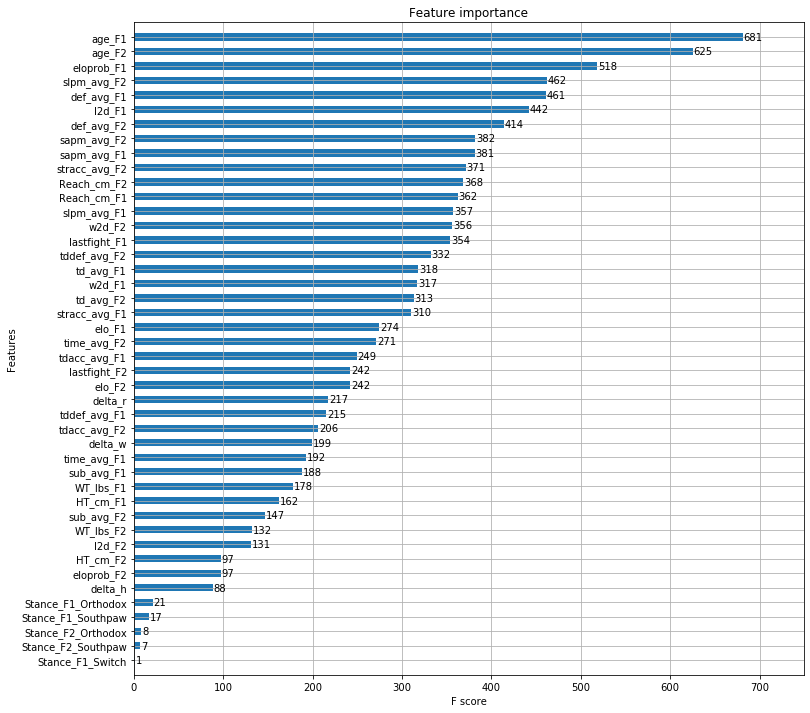

In [ ]:
fig, ax = plt.subplots(figsize=(12,12))
_ = xgb.plot_importance(model, height=0.5, ax=ax)
_ = plt.show()

### XGBoost Structured Optimization

##### Total vs. Partial Stack

In [ ]:
def random_switch(df,perc,random_state):
    sample = df.sample(int(df.shape[0]*perc),random_state=random_state)
    rest = df.drop(sample.index,axis=0)
    
    a = list(sample.loc[:,'Fighter_1':].columns)
    b = [i[:-1]+str(int(i[-1:])*-1+3) if i[-1].isdigit() else i for i in a]
    
    dictionary = dict(zip(a, b))
    sample = sample.rename(columns=dictionary)
    sample.Result = sample.Result*-1+1
    sample.delta_h = sample.delta_h * -1
    sample.delta_r = sample.delta_r * -1
    sample.delta_w = sample.delta_w * -1
    
    frames = [rest,sample]
    df = pd.concat(frames,sort=False)
    
    return df

In [ ]:
def dataframe_prep(df,top):
    d = random_switch(df,0.3,top+1)
    d = pd.get_dummies(d, drop_first = True, columns = ['Stance_F1','Stance_F2'])
    d.reset_index(inplace=True)
    d.drop('MID',axis=1,inplace=True)
    d.drop(d.loc[:,'Event':'FID_F2'],axis= 1,inplace= True)
    d.drop('fight_time',axis= 1,inplace= True)
    d.drop(d.select_dtypes(include = 'object').columns, axis = 1,inplace=True)
    d = d.sample(frac=1)
    return d['Result'],d.drop('Result', axis = 1)

In [ ]:
def new_win_loss_loop(top):

    cv = pd.DataFrame(np.zeros((10,7)),columns = ['n_est','max_dep','colsample','learn','best_auc','best_logloss','best_accuracy'])
    y_data, x_data = dataframe_prep(df,top)

    # Cross Validation with different random splits
    kf = KFold(n_splits=10,shuffle = True, random_state = 42)
    kf.get_n_splits(x_data)
    random = 0
    
    importance = pd.DataFrame(columns=x_data.columns)
    importance.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/importance_results.csv',mode='a+',header = True)


    for train_index, test_index in kf.split(x_data):
        
        X_train, X_test = x_data.loc[train_index,:], x_data.loc[test_index,:]
        y_train, y_test = y_data.loc[train_index], y_data.loc[test_index]
        
        # Boost! First loop with n_est
        log = pd.DataFrame(columns=['n_est','auc_holdout','logloss'] )
        for n_est in range(300,1200,50):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.01,
                        max_depth = 6, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            auc_holdout = roc_auc_score(y_test, predictions)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            log = log.append(pd.DataFrame([[n_est, auc_holdout,logloss]],columns=['n_est','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log.iloc[:,0], log.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/n_est_{random:02d}_{top:02d}.png')
        n_est = int(log[log['logloss'] == log['logloss'].min()]['n_est'])

        # Boost! Second loop on sub-trainingsset to identify optimal max_depth. Best is identified in plot.
        log2 = pd.DataFrame(columns=['max_dep','auc_holdout','logloss'] )
        for max_dep in range(2,10,1):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.01,
                        max_depth = max_dep, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            auc_holdout = roc_auc_score(y_test, predictions)
            log2 = log2.append(pd.DataFrame([[max_dep, auc_holdout,logloss]],columns=['max_dep','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log2.iloc[:,0], log2.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/max_dep_{random:02d}_{top:02d}.png')
        max_dep = int(log2[log2['logloss'] == log2['logloss'].min()]['max_dep'])

        # Boost! Third loop on sub-trainingsset to identify optimal alpha. Apparently, alpha has no influence. I later switched from optimizing alpha to optimizing colsample_bytree
        log3 = pd.DataFrame(columns=['colsample','auc_holdout','logloss'] )
        for colsample in np.arange(0.2,0.7,0.05):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = 0.01,
                        max_depth = max_dep, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            auc_holdout = roc_auc_score(y_test, predictions)
            log3 = log3.append(pd.DataFrame([[colsample, auc_holdout,logloss]],columns=['colsample','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log3.iloc[:,0], log3.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/colsample_{random:02d}_{top:02d}.png')
        colsample = float(max(log3[log3['logloss'] == log3['logloss'].min()]['colsample']))

        # Boost! Fourth loop with different learning rates. 
        log4 = pd.DataFrame(columns=['learn','auc_holdout','logloss'] )
        for learn in np.arange(0.006,0.026,0.002):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = learn,
                        max_depth = max_dep, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            auc_holdout = roc_auc_score(y_test, predictions)
            log4 = log4.append(pd.DataFrame([[learn, auc_holdout,logloss]],columns=['learn','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log4.iloc[:,0], log4.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/learn_{random:02d}_{top:02d}.png')
        learn = float(max(log4[log4['logloss'] == log4['logloss'].min()]['learn']))

        # final prediction
        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = learn,
                    max_depth = max_dep, alpha = 3, n_estimators = n_est)
        model = xg_reg.fit(X_train,y_train)
        
        
        importance = importance.append(pd.Series(model.feature_importances_,name=f'{top:02d}_{random:02d}',index=X_train.columns))

        predictions = xg_reg.predict(X_test)
        auc_holdout = roc_auc_score(y_test, predictions)
        logloss = log_loss(y_test, predictions, eps=1e-15)
        accuracy = accuracy_score(y_test, predictions.round(), normalize=True)
        
        cv.loc[random,:] = [n_est,max_dep,colsample,learn,auc_holdout,logloss,accuracy]
        cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/cv_results_{top:02d}.csv')
        
        print(f'Final Results for Round {random} in Top CV {top}: \nLolgloss:{logloss} \nAUC: {auc_holdout}, \nAccuracy: {accuracy}\n')
        random += 1
    
    importance.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/importance_results.csv',mode='a+',header = False)
    top_cv.loc[top,:] = [cv.n_est.mean(),cv.max_dep.mean(),cv.colsample.mean(),cv.learn.mean(),cv.best_auc.mean(),cv.best_logloss.mean(),cv.best_accuracy.mean()]
    top_cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/top_cv_results.csv',mode='a+')
    return 1

In [ ]:
top_cv = pd.DataFrame(np.zeros((10,7)),columns = ['n_est','max_dep','colsample','learn','best_auc','best_logloss','best_accuracy'])

Final Results for Round 0 in Top CV 4: 
Lolgloss:0.5868729335101746 
AUC: 0.7516034772445029, 
Accuracy: 0.6823687752355316

Final Results for Round 0 in Top CV 2: 
Lolgloss:0.5778973757829592 
AUC: 0.7610205117054432, 
Accuracy: 0.6904441453566622

Final Results for Round 0 in Top CV 3: 
Lolgloss:0.5899125981153381 
AUC: 0.7447243318453243, 
Accuracy: 0.6864064602960969

Final Results for Round 0 in Top CV 1: 
Lolgloss:0.573028260803735 
AUC: 0.7727391304347825, 
Accuracy: 0.693135935397039

Final Results for Round 0 in Top CV 0: 
Lolgloss:0.5676684583353021 
AUC: 0.7744715706457131, 
Accuracy: 0.7065948855989233

Final Results for Round 1 in Top CV 2: 
Lolgloss:0.5746064548146276 
AUC: 0.764201127683321, 
Accuracy: 0.7039030955585465

Final Results for Round 1 in Top CV 3: 
Lolgloss:0.5791297015586109 
AUC: 0.7594387680843013, 
Accuracy: 0.6689098250336474

Final Results for Round 1 in Top CV 4: 
Lolgloss:0.5372476448764972 
AUC: 0.8061014492753624, 
Accuracy: 0.7133243606998654

Fin

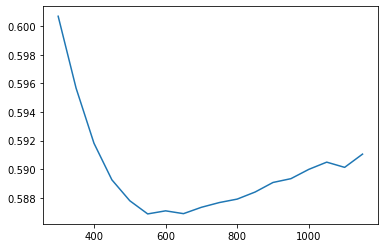

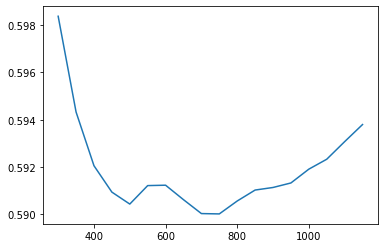

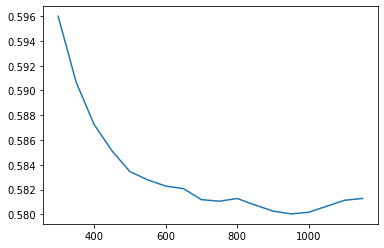

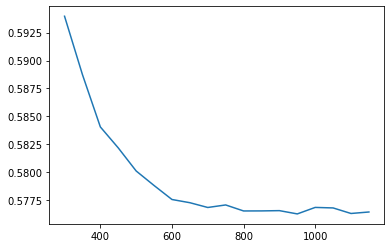

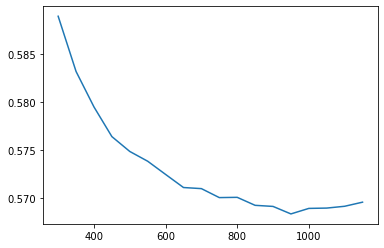

...

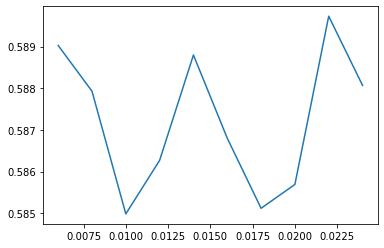

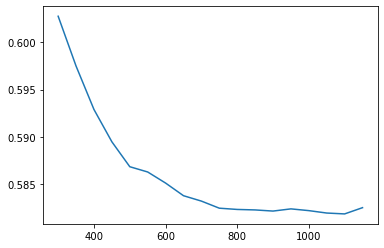

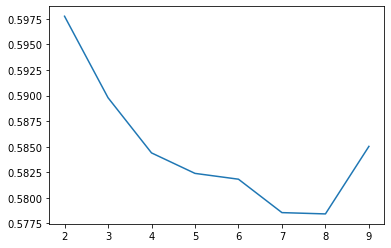

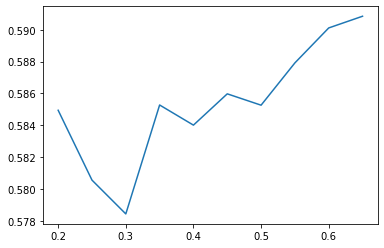

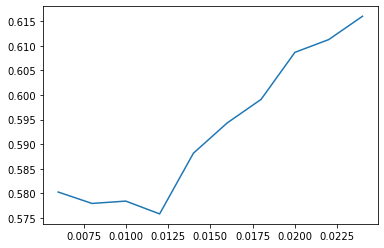

In [ ]:
# START THREADS WITH CV AND RANDOM SWITCH OF F1 F2
t0 = Thread(target=new_win_loss_loop, args=(0,))
t1 = Thread(target=new_win_loss_loop, args=(1,))
t2 = Thread(target=new_win_loss_loop, args=(2,))
t3 = Thread(target=new_win_loss_loop, args=(3,))
t4 = Thread(target=new_win_loss_loop, args=(4,))
#t5 = Thread(target=new_win_loss_loop, args=(5,))
#t6 = Thread(target=new_win_loss_loop, args=(6,))
#t7 = Thread(target=new_win_loss_loop, args=(7,))
#t8 = Thread(target=new_win_loss_loop, args=(8,))
#t9 = Thread(target=new_win_loss_loop, args=(9,))

t0.start()
t1.start()
t2.start()
t3.start()
t4.start()

            
t0.join()
t1.join()
t2.join()
t3.join()
t4.join()


In [ ]:
def add_switch(df,perc,random_state):
    sample = df.sample(int(df.shape[0]*perc),random_state=random_state)
    rest = df
    
    a = list(sample.loc[:,'Fighter_1':].columns)
    b = [i[:-1]+str(int(i[-1:])*-1+3) if i[-1].isdigit() else i for i in a]
    
    dictionary = dict(zip(a, b))
    sample = sample.rename(columns=dictionary)
    sample.Result = sample.Result*-1+1
    sample.delta_h = sample.delta_h * -1
    sample.delta_r = sample.delta_r * -1
    sample.delta_w = sample.delta_w * -1
    
    frames = [rest,sample]
    df = pd.concat(frames,sort=False)
    
    return df

In [ ]:
def dataframe_prep_add(df,top):
    d = add_switch(df,1,top+1)
    d = pd.get_dummies(d, drop_first = True, columns = ['Stance_F1','Stance_F2'])
    d.reset_index(inplace=True)
    d.drop('MID',axis=1,inplace=True)
    d.drop(d.loc[:,'Event':'FID_F2'],axis= 1,inplace= True)
    d.drop('fight_time',axis= 1,inplace= True)
    d.drop(d.select_dtypes(include = 'object').columns, axis = 1,inplace=True)
    d = d.sample(frac=1)
    return d['Result'],d.drop('Result', axis = 1)

In [ ]:
def new_win_2_loss_loop(top):

    cv = pd.DataFrame(np.zeros((10,7)),columns = ['n_est','max_dep','colsample','learn','best_auc','best_logloss','best_accuracy'])
    y_data, x_data = dataframe_prep_add(df,top)

    # Cross Validation with different random splits
    kf = KFold(n_splits=10,shuffle = True, random_state = 42)
    kf.get_n_splits(x_data)
    random = 0
    
    importance = pd.DataFrame(columns=x_data.columns)
    importance.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/importance_results_2.csv',mode='a+',header = True)


    for train_index, test_index in kf.split(x_data):
        
        X_train, X_test = x_data.loc[train_index,:], x_data.loc[test_index,:]
        y_train, y_test = y_data.loc[train_index], y_data.loc[test_index]
        
        # Boost! First loop with n_est
        log = pd.DataFrame(columns=['n_est','auc_holdout','logloss'] )
        for n_est in range(900,1650,50):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.01,
                        max_depth = 6, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            auc_holdout = roc_auc_score(y_test, predictions)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            log = log.append(pd.DataFrame([[n_est, auc_holdout,logloss]],columns=['n_est','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log.iloc[:,0], log.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/n_est_{random:02d}_{top:02d}_2.png')
        n_est = int(log[log['logloss'] == log['logloss'].min()]['n_est'])

        # Boost! Second loop on sub-trainingsset to identify optimal max_depth. Best is identified in plot.
        log2 = pd.DataFrame(columns=['max_dep','auc_holdout','logloss'] )
        for max_dep in range(2,10,1):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.01,
                        max_depth = max_dep, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            auc_holdout = roc_auc_score(y_test, predictions)
            log2 = log2.append(pd.DataFrame([[max_dep, auc_holdout,logloss]],columns=['max_dep','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log2.iloc[:,0], log2.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/max_dep_{random:02d}_{top:02d}_2.png')
        max_dep = int(log2[log2['logloss'] == log2['logloss'].min()]['max_dep'])

        # Boost! Third loop on sub-trainingsset to identify optimal alpha. Apparently, alpha has no influence. I later switched from optimizing alpha to optimizing colsample_bytree
        log3 = pd.DataFrame(columns=['colsample','auc_holdout','logloss'] )
        for colsample in np.arange(0.2,0.7,0.05):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = 0.01,
                        max_depth = max_dep, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            auc_holdout = roc_auc_score(y_test, predictions)
            log3 = log3.append(pd.DataFrame([[colsample, auc_holdout,logloss]],columns=['colsample','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log3.iloc[:,0], log3.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/colsample_{random:02d}_{top:02d}_2.png')
        colsample = float(max(log3[log3['logloss'] == log3['logloss'].min()]['colsample']))

        # Boost! Fourth loop with different learning rates. 
        log4 = pd.DataFrame(columns=['learn','auc_holdout','logloss'] )
        for learn in np.arange(0.006,0.026,0.002):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = learn,
                        max_depth = max_dep, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            auc_holdout = roc_auc_score(y_test, predictions)
            log4 = log4.append(pd.DataFrame([[learn, auc_holdout,logloss]],columns=['learn','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log4.iloc[:,0], log4.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/learn_{random:02d}_{top:02d}_2.png')
        learn = float(max(log4[log4['logloss'] == log4['logloss'].min()]['learn']))

        # final prediction
        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = learn,
                    max_depth = max_dep, alpha = 3, n_estimators = n_est)
        model = xg_reg.fit(X_train,y_train)
        
        
        importance = importance.append(pd.Series(model.feature_importances_,name=f'{top:02d}_{random:02d}',index=X_train.columns))

        predictions = xg_reg.predict(X_test)
        auc_holdout = roc_auc_score(y_test, predictions)
        logloss = log_loss(y_test, predictions, eps=1e-15)
        accuracy = accuracy_score(y_test, predictions.round(), normalize=True)
        
        cv.loc[random,:] = [n_est,max_dep,colsample,learn,auc_holdout,logloss,accuracy]
        cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/cv_results_{top:02d}_2.csv')
        
        print(f'Final Results for Round {random} in Top CV {top}: \nLolgloss:{logloss} \nAUC: {auc_holdout}, \nAccuracy: {accuracy}\n')
        random += 1
    
    importance.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/importance_results_2.csv',mode='a+',header = False)
    top_cv.loc[top,:] = [cv.n_est.mean(),cv.max_dep.mean(),cv.colsample.mean(),cv.learn.mean(),cv.best_auc.mean(),cv.best_logloss.mean(),cv.best_accuracy.mean()]
    top_cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/top_cv_results_2.csv',mode='a+')
    return 1

Final Results for Round 0 in Top CV 0: 
Lolgloss:0.5814321532331231 
AUC: 0.7508688774973427, 
Accuracy: 0.6814814814814815

Final Results for Round 0 in Top CV 3: 
Lolgloss:0.5782788956042392 
AUC: 0.7617575739975753, 
Accuracy: 0.6895622895622896

Final Results for Round 0 in Top CV 1: 
Lolgloss:0.5832101708428576 
AUC: 0.7578425107652984, 
Accuracy: 0.6942760942760943

Final Results for Round 0 in Top CV 5: 
Lolgloss:0.5743509115619893 
AUC: 0.7591410215016706, 
Accuracy: 0.6821548821548822

Final Results for Round 0 in Top CV 8: 
Lolgloss:0.5702039630813932 
AUC: 0.7682429463270783, 
Accuracy: 0.6976430976430976

Final Results for Round 0 in Top CV 6: 
Lolgloss:0.5806369049204921 
AUC: 0.7535968677767819, 
Accuracy: 0.6902356902356902

Final Results for Round 0 in Top CV 2: 
Lolgloss:0.5778484881821054 
AUC: 0.7619262890341322, 
Accuracy: 0.6922558922558922

Final Results for Round 0 in Top CV 9: 
Lolgloss:0.5730568825822286 
AUC: 0.7636887922049151, 
Accuracy: 0.6868686868686869



Final Results for Round 6 in Top CV 6: 
Lolgloss:0.5904632032763544 
AUC: 0.7436822842404482, 
Accuracy: 0.6738544474393531

Final Results for Round 6 in Top CV 3: 
Lolgloss:0.581146622691655 
AUC: 0.756206543298677, 
Accuracy: 0.6886792452830188

Final Results for Round 7 in Top CV 2: 
Lolgloss:0.576262099163185 
AUC: 0.7588475482610054, 
Accuracy: 0.6785714285714286

Final Results for Round 7 in Top CV 5: 
Lolgloss:0.5814025176612464 
AUC: 0.755459348640411, 
Accuracy: 0.6752021563342318

Final Results for Round 6 in Top CV 4: 
Lolgloss:0.5586369767536552 
AUC: 0.7805443201729247, 
Accuracy: 0.7035040431266847

Final Results for Round 7 in Top CV 8: 
Lolgloss:0.5834412702755887 
AUC: 0.7528364242209051, 
Accuracy: 0.6745283018867925

Final Results for Round 7 in Top CV 0: 
Lolgloss:0.5746943267229242 
AUC: 0.7638073667161708, 
Accuracy: 0.6893530997304582

Final Results for Round 6 in Top CV 7: 
Lolgloss:0.5830229580743775 
AUC: 0.7512237651097529, 
Accuracy: 0.6684636118598383

Fina

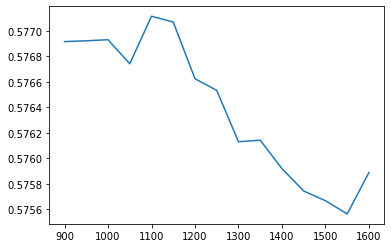

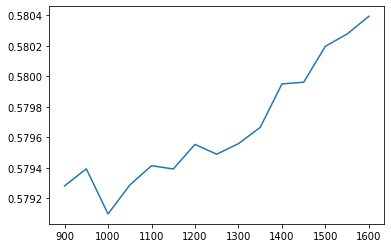

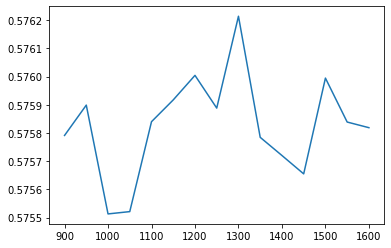

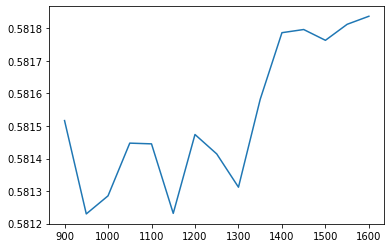

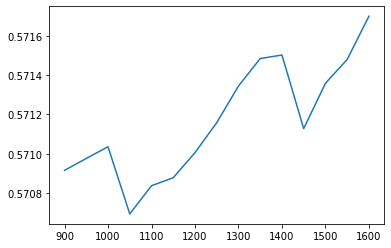

...

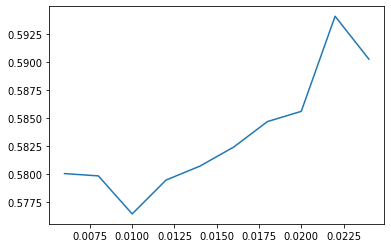

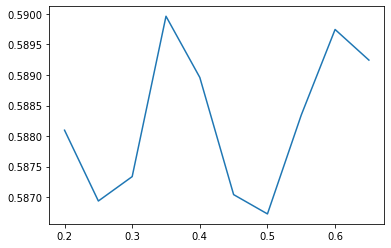

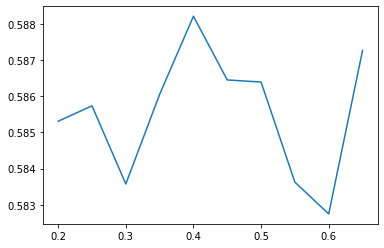

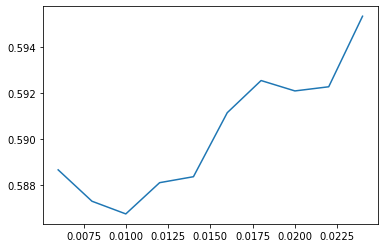

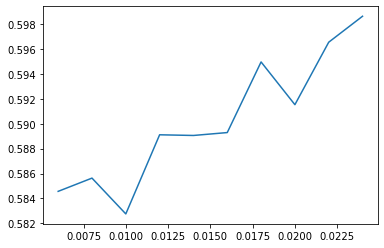

In [ ]:
# START THREADS WITH CV AND COMPLETE DATA
top_cv = pd.DataFrame(np.zeros((10,7)),columns = ['n_est','max_dep','colsample','learn','best_auc','best_logloss','best_accuracy'])
t0 = Thread(target=new_win_2_loss_loop, args=(0,))
t1 = Thread(target=new_win_2_loss_loop, args=(1,))
t2 = Thread(target=new_win_2_loss_loop, args=(2,))
t3 = Thread(target=new_win_2_loss_loop, args=(3,))
t4 = Thread(target=new_win_2_loss_loop, args=(4,))
t5 = Thread(target=new_win_2_loss_loop, args=(5,))
t6 = Thread(target=new_win_2_loss_loop, args=(6,))
t7 = Thread(target=new_win_2_loss_loop, args=(7,))
t8 = Thread(target=new_win_2_loss_loop, args=(8,))
t9 = Thread(target=new_win_2_loss_loop, args=(9,))

t0.start()
t1.start()
t2.start()
t3.start()
t4.start()
t5.start()
t6.start()
t7.start()
t8.start()
t9.start()
            
t0.join()
t1.join()
t2.join()
t3.join()
t4.join()
t5.join()
t6.join()
t7.join()
t8.join()
t9.join()

In [ ]:
frames = []
for i in range(10):
    r = pd.read_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/cv_results_{i:02d}.csv')
    frames.append(r)

In [ ]:
r = pd.concat(frames,ignore_index=True)

In [ ]:
r = r.drop(r[r.max_dep == 0].index,axis=0)

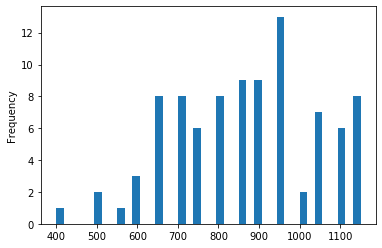

In [ ]:
r.n_est.plot(kind='hist', bins = 40)

Top with normal CV:
950 nest
6 max:dep
0.01 learn
0.3 colsample

Top with total Dataset: nest >1150
maxdep 6 or 7
colsample 0.3
learn 0.1

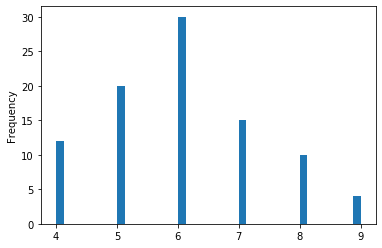

In [ ]:
r.max_dep.plot(kind='hist', bins = 40)

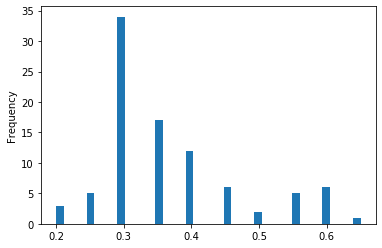

In [ ]:
r.colsample.plot(kind='hist', bins = 40)

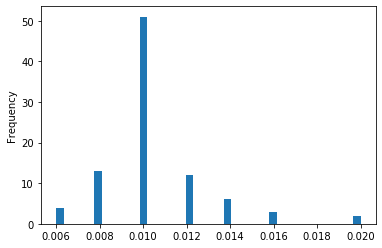

In [ ]:
r.learn.plot(kind='hist', bins = 40)

0.5765919956702129

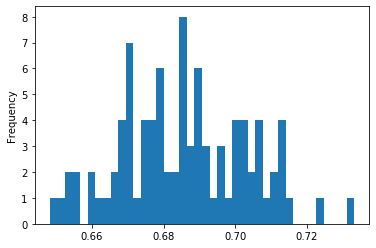

In [ ]:
r.best_accuracy.plot(kind='hist', bins = 40)
r.best_logloss.mean()

In [ ]:
imp = pd.read_csv('D:/jasper/98_general_projects/03_UFC_Predictions/boosting/importance_results_2.csv')

In [ ]:
imp = imp[imp.HT_cm_F1 != 'HT_cm_F1']
imp.to_csv('D:/jasper/98_general_projects/03_UFC_Predictions/boosting/importance_results.csv')
imp = pd.read_csv('D:/jasper/98_general_projects/03_UFC_Predictions/boosting/importance_results.csv')

In [ ]:
# imp.drop('Unnamed: 0',axis=1,inplace=True)
imp.drop('Unnamed: 0.1',axis=1,inplace=True)

In [ ]:
imp

,Unnamed: 0,HT_cm_F1,HT_cm_F2,Reach_cm_F1,Reach_cm_F2,WT_lbs_F1,WT_lbs_F2,age_F1,age_F2,delta_h,delta_w,delta_r,w2d_F1,l2d_F1,time_avg_F1,slpm_avg_F1,stracc_avg_F1,sapm_avg_F1,def_avg_F1,td_avg_F1,tdacc_avg_F1,tddef_avg_F1,sub_avg_F1,lastfight_F1,w2d_F2,l2d_F2,time_avg_F2,slpm_avg_F2,stracc_avg_F2,sapm_avg_F2,def_avg_F2,td_avg_F2,tdacc_avg_F2,tddef_avg_F2,sub_avg_F2,lastfight_F2,elo_F1,elo_F2,eloprob_F1,eloprob_F2,Head_perT_1,Head_acc_1,Head_perT_2,Head_acc_2,Body_perT_1,Body_acc_1,Body_perT_2,Body_acc_2,Leg_perT_1,Leg_acc_1,Leg_perT_2,Leg_acc_2,Distance_perT_1,Distance_acc_1,Distance_perT_2,Distance_acc_2,Clinch_perT_1,Clinch_acc_1,Clinch_perT_2,Clinch_acc_2,Ground_perT_1,Ground_acc_1,Ground_perT_2,Ground_acc_2,PASS_perT_1,PASS_perT_2,REV_perT_1,REV_perT_2,KD_perT_1,KD_perT_2,pca_0_F1,pca_1_F1,pca_2_F1,pca_3_F1,pca_4_F1,pca_0_F2,pca_1_F2,pca_2_F2,pca_3_F2,pca_4_F2,Stance_F1_Orthodox,Stance_F1_Sideways,Stance_F1_Southpaw,Stance_F1_Switch,Stance_F2_Orthodox,Stance_F2_Sideways,Stance_F2_Southpaw,Stance_F2_Switch
0,9,0.008478,0.008323,0.042528,0.037980,0.008959,0.008197,0.019120,0.019101,0.006494,0.007841,0.044173,0.009052,0.013798,0.008807,0.011468,0.008863,0.014365,0.011499,0.012093,0.009007,0.009508,0.008788,0.010160,0.009814,0.012761,0.008458,0.012004,0.008802,0.013844,0.011429,0.011944,0.009129,0.009166,0.008981,0.009964,0.011847,0.011944,0.024982,0.033054,0.015846,0.009513,0.014214,0.009840,0.009441,0.008377,0.009210,0.008790,0.008927,0.008361,0.009102,0.008583,0.009444,0.009187,0.010945,0.009299,0.009391,0.008755,0.009341,0.008650,0.008815,0.009278,0.009712,0.009582,0.009845,0.009935,0.009005,0.009121,0.008839,0.008817,0.009447,0.009869,0.009413,0.009259,0.019214,0.010019,0.010018,0.009809,0.009033,0.018068,0.009255,0.0,0.008631,0.005811,0.011748,0.000000,0.008578,0.006937
1,10,0.007742,0.008701,0.034598,0.042750,0.008645,0.007564,0.019485,0.020812,0.006760,0.007571,0.054743,0.009396,0.012685,0.008641,0.012469,0.008050,0.015564,0.010352,0.011714,0.008535,0.009679,0.008603,0.009752,0.009973,0.013154,0.008692,0.011039,0.008422,0.015357,0.011763,0.012060,0.008806,0.008334,0.009225,0.010287,0.011993,0.010879,0.020966,0.030428,0.014818,0.009364,0.014837,0.010403,0.008869,0.009069,0.010084,0.008629,0.009251,0.008204,0.008989,0.008293,0.009965,0.008627,0.011562,0.008465,0.009803,0.008918,0.008877,0.008421,0.008852,0.009659,0.008631,0.009242,0.009909,0.010080,0.007982,0.009143,0.008498,0.007720,0.010141,0.009491,0.008838,0.009401,0.021288,0.010300,0.009254,0.009104,0.008743,0.018766,0.012292,0.0,0.008064,0.007538,0.009694,0.000000,0.008175,0.007557
2,11,0.007820,0.007631,0.042217,0.039058,0.007551,0.006954,0.020261,0.020048,0.006181,0.006822,0.062292,0.008914,0.012135,0.007617,0.012243,0.007421,0.014642,0.010794,0.011381,0.009171,0.009105,0.008207,0.011897,0.009395,0.012998,0.007311,0.014194,0.007728,0.014311,0.012699,0.011513,0.009465,0.009014,0.007808,0.010443,0.013656,0.014456,0.024169,0.029274,0.016326,0.008541,0.015582,0.009593,0.009134,0.008410,0.008254,0.007758,0.008524,0.007461,0.008259,0.007787,0.009124,0.007884,0.009333,0.008532,0.008348,0.007627,0.007979,0.007937,0.008317,0.009081,0.008095,0.007889,0.011732,0.010941,0.008418,0.008165,0.007863,0.007844,0.008982,0.009354,0.009673,0.009002,0.019883,0.009271,0.009684,0.009811,0.009298,0.019469,0.012149,0.0,0.009622,0.008425,0.012804,0.000000,0.007298,0.005746
3,12,0.007824,0.007195,0.043694,0.043642,0.007895,0.007680,0.019650,0.019391,0.005509,0.007115,0.046501,0.008924,0.012978,0.008416,0.011946,0.008047,0.014227,0.010895,0.011993,0.009328,0.009147,0.008241,0.010132,0.009817,0.013183,0.008217,0.012198,0.007955,0.014131,0.010850,0.011524,0.009611,0.008941,0.008673,0.011678,0.013173,0.014095,0.021814,0.027726,0.014209,0.009090,0.014430,0.009569,0.009424,0.008843,0.009368,0.008803,0.008073,0.007885,0.009286,0.007626,0.009498,0.008857,0.010058,0.008546,0.008920,0.009309,0.008373,0.008264,0.009308,0.008804,0.008794,0.008482,0.010625,0.010419,0.009130,0.008730,0.009157,0.008358,

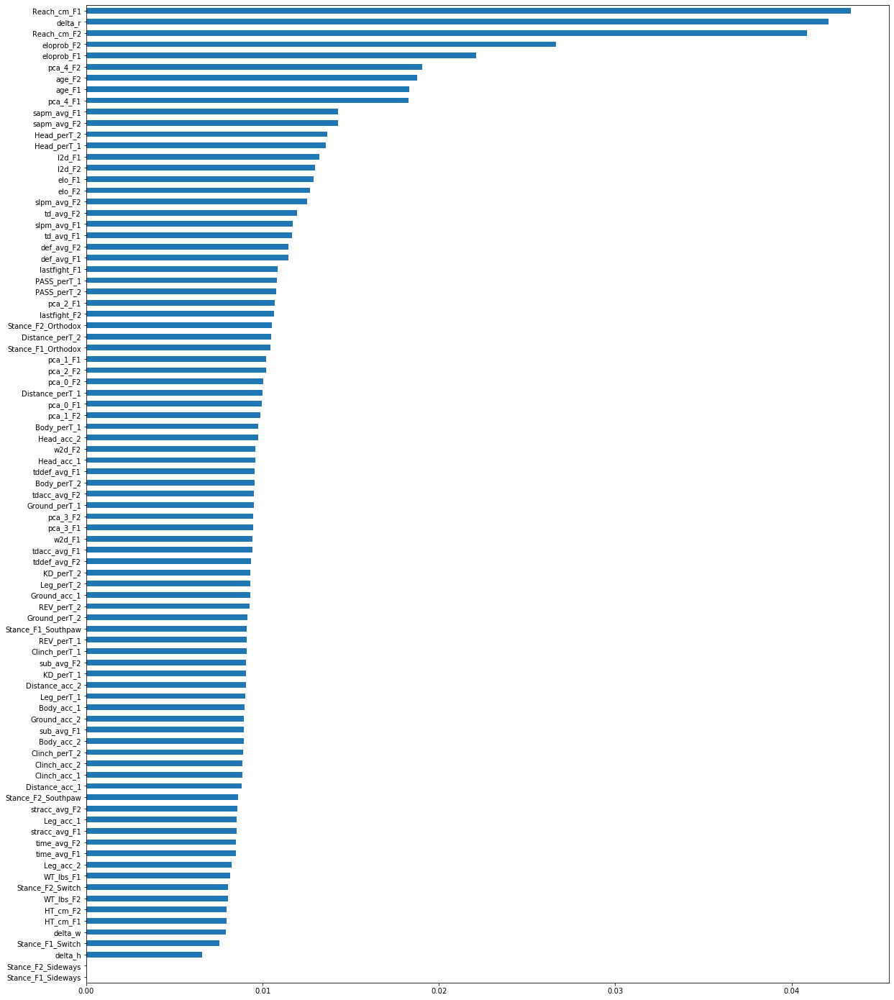

In [ ]:
imp.loc[:,'HT_cm_F1':].mean().sort_values().plot(kind = 'barh',figsize=(20,25))

Final Results for Round0: 
n_estimator: 350, 
max_depth: 7, 
colsample: 0.30000000000000004, 
learning rate: 0.02
0.6139030898614093
Final Results for Round1: 
n_estimator: 350, 
max_depth: 6, 
colsample: 0.7000000000000002, 
learning rate: 0.014
0.6185809158410471
Final Results for Round2: 
n_estimator: 400, 
max_depth: 7, 
colsample: 0.30000000000000004, 
learning rate: 0.016
0.6109973202994743


KeyboardInterrupt: 

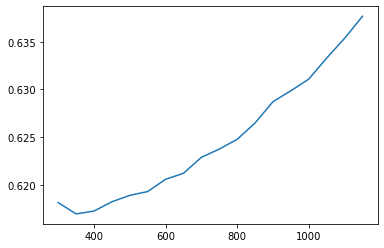

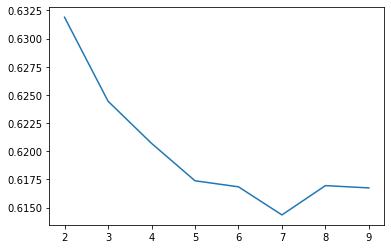

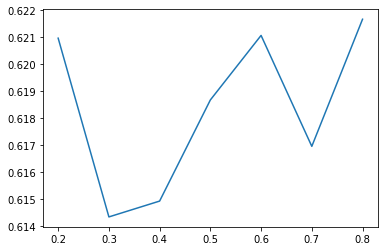

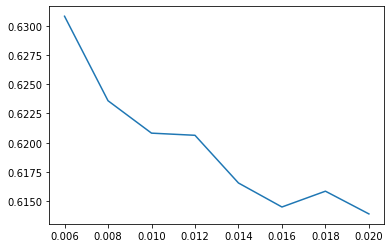

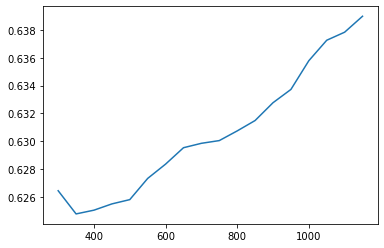

...

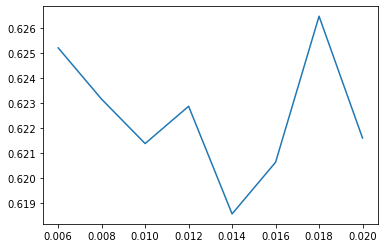

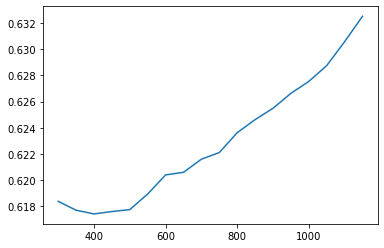

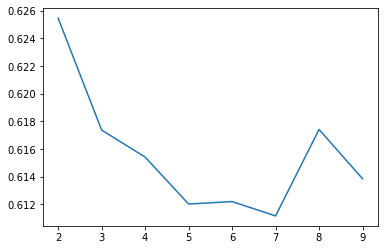

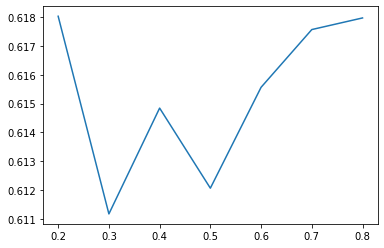

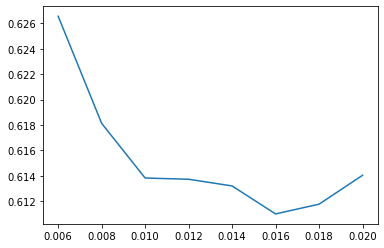

In [ ]:
for top in range(10):
    d = random_switch(df,0.3,top+1)
    d = pd.get_dummies(d, drop_first = True, columns = ['Stance_F1','Stance_F2'])
    d.reset_index(inplace=True)
    d.drop(d.loc[:,'MID':'FID_F2'],axis= 1,inplace= True)
    d.drop('fight_time',axis= 1,inplace= True)
    d.drop(d.select_dtypes(include = 'object').columns, axis = 1,inplace=True)

    cv = pd.DataFrame(np.zeros((10,6)),columns = ['n_est','max_dep','colsample','learn','best_auc','best_logloss'])

    y_data = d['Result']
    x_data = d.drop('Result', axis = 1)

    # Cross Validation with different random splits
    kf = KFold(n_splits=10,shuffle = True, random_state = 42)
    kf.get_n_splits(x_data)
    random = 0

    for train_index, test_index in kf.split(x_data):
        X_train, X_test = x_data.loc[train_index,:], x_data.loc[test_index,:]
        y_train, y_test = y_data.loc[train_index], y_data.loc[test_index]

        # Boost! First loop with n_est
        log = pd.DataFrame(columns=['n_est','auc_holdout','logloss'] )
        for n_est in range(300,1200,50):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.015,
                        max_depth = 8, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            auc_holdout = roc_auc_score(y_test, predictions)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            log = log.append(pd.DataFrame([[n_est, auc_holdout,logloss]],columns=['n_est','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log.iloc[:,0], log.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/n_est_{random:02d}_{top:02d}.png')
        n_est = int(log[log['logloss'] == log['logloss'].min()]['n_est'])

        # Boost! Second loop on sub-trainingsset to identify optimal max_depth. Best is identified in plot.
        log2 = pd.DataFrame(columns=['max_dep','auc_holdout','logloss'] )
        for max_dep in range(2,10,1):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.015,
                        max_depth = max_dep, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            auc_holdout = roc_auc_score(y_test, predictions)
            log2 = log2.append(pd.DataFrame([[max_dep, auc_holdout,logloss]],columns=['max_dep','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log2.iloc[:,0], log2.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/max_dep_{random:02d}_{top:02d}.png')
        max_dep = int(log2[log2['logloss'] == log2['logloss'].min()]['max_dep'])

        # Boost! Third loop on sub-trainingsset to identify optimal alpha. Apparently, alpha has no influence. I later switched from optimizing alpha to optimizing colsample_bytree
        log3 = pd.DataFrame(columns=['colsample','auc_holdout','logloss'] )
        for colsample in np.arange(0.2,0.9,0.1):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = 0.015,
                        max_depth = max_dep, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            auc_holdout = roc_auc_score(y_test, predictions)
            log3 = log3.append(pd.DataFrame([[colsample, auc_holdout,logloss]],columns=['colsample','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log3.iloc[:,0], log3.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/colsample_{random:02d}_{top:02d}.png')
        colsample = float(max(log3[log3['logloss'] == log3['logloss'].min()]['colsample']))

        # Boost! Fourth loop with different learning rates. 
        log4 = pd.DataFrame(columns=['learn','auc_holdout','logloss'] )
        for learn in np.arange(0.006,0.021,0.002):
            xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = learn,
                        max_depth = max_dep, alpha = 3, n_estimators = n_est)
            xg_reg.fit(X_train,y_train)

            predictions = xg_reg.predict(X_test)
            logloss = log_loss(y_test, predictions, eps=1e-15)
            auc_holdout = roc_auc_score(y_test, predictions)
            log4 = log4.append(pd.DataFrame([[learn, auc_holdout,logloss]],columns=['learn','auc_holdout','logloss']))

        plt.figure()
        plt.plot(log4.iloc[:,0], log4.iloc[:,2])
        plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/learn_{random:02d}_{top:02d}.png')
        learn = float(max(log4[log4['logloss'] == log4['logloss'].min()]['learn']))

        print(f'Final Results for Round{random}: \nn_estimator: {n_est}, \nmax_depth: {max_dep}, \ncolsample: {colsample}, \nlearning rate: {learn}')

        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = learn,
                    max_depth = max_dep, alpha = 3, n_estimators = n_est)
        xg_reg.fit(X_train,y_train)

        predictions = xg_reg.predict(X_test)
        auc_holdout = roc_auc_score(y_test, predictions)
        logloss = log_loss(y_test, predictions, eps=1e-15)
        cv.loc[random,:] = [n_est,max_dep,colsample,learn,auc_holdout,logloss]
        cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/cv_results_{top:02d}.csv')
        print(logloss)
        random += 1
        
    top_cv.loc[top,:] = [cv.n_est.mean(),cv.max_dep.mean(),cv.colsample.mean(),cv.learn.mean(),cv.best_auc.mean(),cv.best_logloss.mean()]
    top_cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/top_cv_results_{top:02d}.csv')

In [ ]:
# Cross Validation with different random splits
for random in range(folds):
    y_data = np.array(d['Result'])
    x_data = d.drop('Result', axis = 1)
    X_train, X_test, y_train, y_test = train_test_split(x_data, y_data, test_size = 0.2, random_state = random)

    # Boost! First loop with n_est
    log = pd.DataFrame(columns=['n_est','auc_holdout'] )
    for n_est in range(300,1200,50):
        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.015,
                    max_depth = 8, alpha = 3, n_estimators = n_est)
        xg_reg.fit(X_train,y_train)

        predictions = xg_reg.predict(X_test)
        fpr, tpr, thresholds = roc_curve(y_test,predictions)
        auc_holdout = roc_auc_score(y_test, predictions)
        print('AUC: %.4f' % auc_holdout, 'with n_estimator = ',n_est)
        log = log.append(pd.DataFrame([[n_est, auc_holdout]],columns=['n_est','auc_holdout']))
    
    plt.figure()
    plt.plot(log.iloc[:,0], log.iloc[:,1])
    plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/{random:02d}_n_est.png')
    n_est = int(log[log['auc_holdout'] == log['auc_holdout'].max()]['n_est'])

    # Boost! Second loop on sub-trainingsset to identify optimal max_depth. Best is identified in plot.
    log2 = pd.DataFrame(columns=['max_dep','auc_holdout'] )
    for max_dep in range(2,10,1):

        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.015,
                    max_depth = max_dep, alpha = 3, n_estimators = n_est)
        xg_reg.fit(X_train,y_train)

        predictions = xg_reg.predict(X_test)
        fpr, tpr, thresholds = roc_curve(y_test,predictions)
        auc_holdout = roc_auc_score(y_test, predictions)

        print('AUC: %.4f' % auc_holdout, 'with max_depth = ',max_dep)
        log2 = log2.append(pd.DataFrame([[max_dep, auc_holdout]],columns=['max_dep','auc_holdout']))
    
    plt.figure()
    plt.plot(log2.iloc[:,0], log2.iloc[:,1])
    plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/{random:02d}_max_dep.png')
    max_dep = int(log2[log2['auc_holdout'] == log2['auc_holdout'].max()]['max_dep'])

    # Boost! Third loop on sub-trainingsset to identify optimal alpha. Apparently, alpha has no influence. I later switched from optimizing alpha to optimizing colsample_bytree
    log3 = pd.DataFrame(columns=['colsample','auc_holdout'] )
    for colsample in np.arange(0.2,0.9,0.1):

        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = 0.015,
                    max_depth = max_dep, alpha = 3, n_estimators = n_est)
        xg_reg.fit(X_train,y_train)

        predictions = xg_reg.predict(X_test)
        fpr, tpr, thresholds = roc_curve(y_test,predictions)
        auc_holdout = roc_auc_score(y_test, predictions)

        print('AUC: %.4f' % auc_holdout, 'with colsample = ',colsample)
        log3 = log3.append(pd.DataFrame([[colsample, auc_holdout]],columns=['colsample','auc_holdout']))
    
    plt.figure()
    plt.plot(log3.iloc[:,0], log3.iloc[:,1])
    plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/{random:02d}_colsample.png')
    colsample = float(max(log3[log3['auc_holdout'] == log3['auc_holdout'].max()]['colsample']))

    # Boost! Fourth loop with different learning rates. 
    log4 = pd.DataFrame(columns=['learn','auc_holdout'] )
    for learn in np.arange(0.006,0.021,0.002):

        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = learn,
                    max_depth = max_dep, alpha = 3, n_estimators = n_est)
        xg_reg.fit(X_train,y_train)

        predictions = xg_reg.predict(X_test)
        fpr, tpr, thresholds = roc_curve(y_test,predictions)
        auc_holdout = roc_auc_score(y_test, predictions)

        print('AUC: %.4f' % auc_holdout, 'with learning rate = ',learn)
        log4 = log4.append(pd.DataFrame([[learn, auc_holdout]],columns=['learn','auc_holdout']))
    
    plt.figure()
    plt.plot(log4.iloc[:,0], log4.iloc[:,1])
    plt.savefig(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/{random:02d}_learn.png')
    learn = float(max(log4[log4['auc_holdout'] == log4['auc_holdout'].max()]['learn']))
    
    print('Final Results: \nn_estimator:', n_est, '\nmax_depth:',max_dep,'\ncolsample:',colsample, '\nlearning rate:',learn)

    xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = learn,
                max_depth = max_dep, alpha = 3, n_estimators = n_est)
    xg_reg.fit(X_train,y_train)

    predictions = xg_reg.predict(X_test)
#     fpr, tpr, thresholds = roc_curve(y_test,predictions)
    auc_holdout = roc_auc_score(y_test, predictions)
    cv.loc[random,:] = [n_est,max_dep,colsample,learn,auc_holdout]
    cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/cv_results.csv')
    print(auc_holdout)

AUC: 0.7535 with n_estimator =  300
AUC: 0.7551 with n_estimator =  350
AUC: 0.7567 with n_estimator =  400
AUC: 0.7579 with n_estimator =  450
AUC: 0.7585 with n_estimator =  500
AUC: 0.7583 with n_estimator =  550
AUC: 0.7590 with n_estimator =  600
AUC: 0.7594 with n_estimator =  650
AUC: 0.7597 with n_estimator =  700
AUC: 0.7596 with n_estimator =  750
AUC: 0.7591 with n_estimator =  800
AUC: 0.7594 with n_estimator =  850
AUC: 0.7590 with n_estimator =  900
AUC: 0.7590 with n_estimator =  950
AUC: 0.7588 with n_estimator =  1000
AUC: 0.7591 with n_estimator =  1050


KeyboardInterrupt: 

**First optimization led to:**
- n_estimator: 650 
- max_depth: 7 
- colsample: 0.30000000000000004 
- learning rate: 0.01


In [ ]:
# Prediction
y_test_pred = xg_reg.predict(X_test)
y_test_pred = pd.Series(y_test_pred, index = X_test.index)
y_test = pd.Series(y_test, index = X_test.index)
df_pred = pd.concat([y_test_pred, y_test],axis=1)
df_pred.columns = ['prediction','actual']
# df_pred.plot(x=0,y=1,kind = 'scatter')
np.corrcoef(y_test, y_test_pred)

array([[1.        , 0.45262017],
       [0.45262017, 1.        ]])

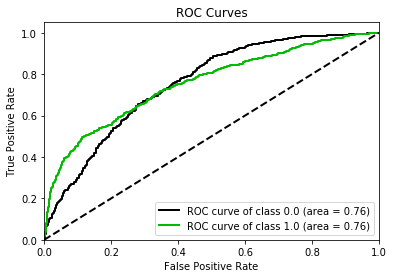

In [ ]:
accuracy_score(y_test, y_test_pred.round(), normalize=True)
pred = np.column_stack([1-y_test_pred, y_test_pred])
_ = skplt.metrics.plot_roc(y_test, pred,plot_macro=False,plot_micro=False)

In [ ]:
log_loss(y_test, y_test_pred, eps=1e-15)

0.5795585008457252

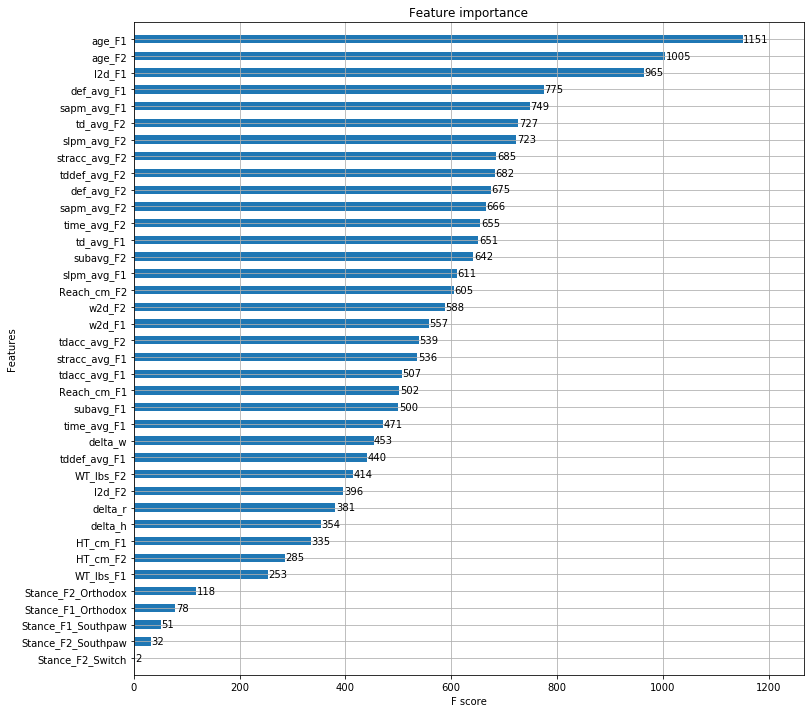

In [ ]:
fig, ax = plt.subplots(figsize=(12,12))
_ = xgb.plot_importance(model, height=0.5, ax=ax)
_ = plt.show()

In [ ]:
xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = colsample, learning_rate = learn,
            max_depth = max_dep, alpha = alpha, n_estimators = n_est)
xg_reg.fit(X_train,y_train)

predictions = xg_reg.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test,predictions)
auc_holdout = roc_auc_score(y_test, predictions)

#### CV on Feature Deletion - Result: 1994 or if req. 1997 best minimal year, feature deletion just helps a little (~30 features)

In [ ]:
list(imp.loc[:,'HT_cm_F1':].mean().sort_values().index[:2])

['Stance_F1_Sideways', 'Stance_F2_Sideways']

In [ ]:
cv = pd.DataFrame(columns = ['deleted_features','cv_round','best_auc','best_logloss','best_accuracy'])

for delfeat in range(80):

    y_data, x_data = dataframe_prep(df,42)
    
    if delfeat >0: x_data = x_data.drop(list(imp.loc[:,'HT_cm_F1':].mean().sort_values().index[:delfeat]),axis=1)

    # Cross Validation with different random splits
    kf = KFold(n_splits=10,shuffle = True, random_state = 42)
    kf.get_n_splits(x_data)
    cvround = 0

    for train_index, test_index in kf.split(x_data):

        X_train, X_test = x_data.loc[train_index,:], x_data.loc[test_index,:]
        y_train, y_test = y_data.loc[train_index], y_data.loc[test_index]

        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.01,
                    max_depth = 6, alpha = 3, n_estimators = 950)
        model = xg_reg.fit(X_train,y_train)

        predictions = xg_reg.predict(X_test)
        auc_holdout = roc_auc_score(y_test, predictions)
        logloss = log_loss(y_test, predictions, eps=1e-15)
        accuracy = accuracy_score(y_test, predictions.round(), normalize=True)

        cv.loc[delfeat,:] = [delfeat,cvround,auc_holdout,logloss,accuracy]
        cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/cv_results_feature_deletion_{delfeat:02d}.csv')
        cvround +=1
        print(f'Final Results {delfeat} deleted features in CV {cvround}: \nLolgloss:{logloss} \nAUC: {auc_holdout}, \nAccuracy: {accuracy}\n')


Final Results 0 delted features in CV 1: 
Lolgloss:0.5653456960607967 
AUC: 0.7770735739873244, 
Accuracy: 0.7119784656796769

Final Results 0 delted features in CV 2: 
Lolgloss:0.576064540093331 
AUC: 0.7645678330620787, 
Accuracy: 0.6823687752355316

Final Results 0 delted features in CV 3: 
Lolgloss:0.5876635153718984 
AUC: 0.7494962673044865, 
Accuracy: 0.6837146702557201

Final Results 0 delted features in CV 4: 
Lolgloss:0.6026607015775141 
AUC: 0.7330920425002003, 
Accuracy: 0.6576819407008087

Final Results 0 delted features in CV 5: 
Lolgloss:0.5799561618372918 
AUC: 0.7605075625363584, 
Accuracy: 0.6698113207547169

Final Results 0 delted features in CV 6: 
Lolgloss:0.5745585151430912 
AUC: 0.7581618117332404, 
Accuracy: 0.6873315363881402

Final Results 0 delted features in CV 7: 
Lolgloss:0.5733309758480668 
AUC: 0.7572879135276777, 
Accuracy: 0.6711590296495957

Final Results 0 delted features in CV 8: 
Lolgloss:0.5920791412224224 
AUC: 0.745361716982916, 
Accuracy: 0.6630

Final Results 6 delted features in CV 6: 
Lolgloss:0.5729851833020018 
AUC: 0.7574422931565788, 
Accuracy: 0.6752021563342318

Final Results 6 delted features in CV 7: 
Lolgloss:0.5721143740354824 
AUC: 0.7587655129744877, 
Accuracy: 0.6752021563342318

Final Results 6 delted features in CV 8: 
Lolgloss:0.5954902857652491 
AUC: 0.7438780482483254, 
Accuracy: 0.6752021563342318

Final Results 6 delted features in CV 9: 
Lolgloss:0.5621288406368937 
AUC: 0.777587762705944, 
Accuracy: 0.7075471698113207

Final Results 6 delted features in CV 10: 
Lolgloss:0.5987461096107598 
AUC: 0.7356334380819367, 
Accuracy: 0.6644204851752021

Final Results 7 delted features in CV 1: 
Lolgloss:0.5645095159300925 
AUC: 0.7789444678104742, 
Accuracy: 0.7106325706594886

Final Results 7 delted features in CV 2: 
Lolgloss:0.5755679100566364 
AUC: 0.7659047314578005, 
Accuracy: 0.6837146702557201

Final Results 7 delted features in CV 3: 
Lolgloss:0.5873333223058791 
AUC: 0.7460462419366529, 
Accuracy: 0.67

Final Results 13 delted features in CV 1: 
Lolgloss:0.5667904086980071 
AUC: 0.7767545068236864, 
Accuracy: 0.7092866756393001

Final Results 13 delted features in CV 2: 
Lolgloss:0.5762791238715158 
AUC: 0.7643571262497093, 
Accuracy: 0.6850605652759085

Final Results 13 delted features in CV 3: 
Lolgloss:0.5891756397367406 
AUC: 0.7464666231789518, 
Accuracy: 0.6877523553162853

Final Results 13 delted features in CV 4: 
Lolgloss:0.6048486795567599 
AUC: 0.7303611351835533, 
Accuracy: 0.6617250673854448

Final Results 13 delted features in CV 5: 
Lolgloss:0.5812135119658878 
AUC: 0.7583333333333334, 
Accuracy: 0.6752021563342318

Final Results 13 delted features in CV 6: 
Lolgloss:0.5694429176806841 
AUC: 0.7630385487528344, 
Accuracy: 0.6778975741239892

Final Results 13 delted features in CV 7: 
Lolgloss:0.5696946660664204 
AUC: 0.7609637151071805, 
Accuracy: 0.6778975741239892

Final Results 13 delted features in CV 8: 
Lolgloss:0.5959412009628474 
AUC: 0.7415216331992698, 
Accura

Final Results 19 delted features in CV 6: 
Lolgloss:0.5701203597584021 
AUC: 0.7621227978370835, 
Accuracy: 0.6859838274932615

Final Results 19 delted features in CV 7: 
Lolgloss:0.5697250646837758 
AUC: 0.7619754703934198, 
Accuracy: 0.6752021563342318

Final Results 19 delted features in CV 8: 
Lolgloss:0.5958110823238274 
AUC: 0.7436671345556631, 
Accuracy: 0.6711590296495957

Final Results 19 delted features in CV 9: 
Lolgloss:0.5617503526387109 
AUC: 0.7795671537521103, 
Accuracy: 0.7115902964959568

Final Results 19 delted features in CV 10: 
Lolgloss:0.5984356034361328 
AUC: 0.7375465549348231, 
Accuracy: 0.6738544474393531

Final Results 20 delted features in CV 1: 
Lolgloss:0.5648027833633897 
AUC: 0.7772113529898043, 
Accuracy: 0.6944818304172274

Final Results 20 delted features in CV 2: 
Lolgloss:0.5782835378874379 
AUC: 0.7643062659846547, 
Accuracy: 0.6917900403768507

Final Results 20 delted features in CV 3: 
Lolgloss:0.5907466678101755 
AUC: 0.7458505472204102, 
Accur

Final Results 26 delted features in CV 1: 
Lolgloss:0.5640973206559349 
AUC: 0.7778132296848487, 
Accuracy: 0.7052489905787349

Final Results 26 delted features in CV 2: 
Lolgloss:0.5763578688109126 
AUC: 0.7668928737502907, 
Accuracy: 0.6944818304172274

Final Results 26 delted features in CV 3: 
Lolgloss:0.5873710116268729 
AUC: 0.75024280640719, 
Accuracy: 0.6850605652759085

Final Results 26 delted features in CV 4: 
Lolgloss:0.6013465616626118 
AUC: 0.7357282783632035, 
Accuracy: 0.6671159029649596

Final Results 26 delted features in CV 5: 
Lolgloss:0.5770767006516014 
AUC: 0.7646742292030251, 
Accuracy: 0.6792452830188679

Final Results 26 delted features in CV 6: 
Lolgloss:0.5717326839118091 
AUC: 0.7589903482760626, 
Accuracy: 0.6819407008086253

Final Results 26 delted features in CV 7: 
Lolgloss:0.5692965803326502 
AUC: 0.761444116897769, 
Accuracy: 0.6805929919137467

Final Results 26 delted features in CV 8: 
Lolgloss:0.5941021388793248 
AUC: 0.74617628020975, 
Accuracy: 0

Final Results 32 delted features in CV 6: 
Lolgloss:0.5737383952866386 
AUC: 0.7562867027152742, 
Accuracy: 0.6859838274932615

Final Results 32 delted features in CV 7: 
Lolgloss:0.5702412248089548 
AUC: 0.7597918258907449, 
Accuracy: 0.6738544474393531

Final Results 32 delted features in CV 8: 
Lolgloss:0.5939783360683573 
AUC: 0.7459944580609031, 
Accuracy: 0.683288409703504

Final Results 32 delted features in CV 9: 
Lolgloss:0.5621318168225233 
AUC: 0.7777551376841124, 
Accuracy: 0.7142857142857143

Final Results 32 delted features in CV 10: 
Lolgloss:0.5967852626964851 
AUC: 0.7380993947858473, 
Accuracy: 0.6563342318059299

Final Results 33 delted features in CV 1: 
Lolgloss:0.5636674531799406 
AUC: 0.7782555727980741, 
Accuracy: 0.7012113055181696

Final Results 33 delted features in CV 2: 
Lolgloss:0.5780380912899751 
AUC: 0.7654687863287607, 
Accuracy: 0.6985195154777928

Final Results 33 delted features in CV 3: 
Lolgloss:0.5842961685739528 
AUC: 0.7543958831630064, 
Accura

Final Results 39 delted features in CV 1: 
Lolgloss:0.5627452724113118 
AUC: 0.7797276326666763, 
Accuracy: 0.7106325706594886

Final Results 39 delted features in CV 2: 
Lolgloss:0.5783083664521596 
AUC: 0.7642917344803535, 
Accuracy: 0.6877523553162853

Final Results 39 delted features in CV 3: 
Lolgloss:0.5890750726822809 
AUC: 0.7477132710009422, 
Accuracy: 0.6837146702557201

Final Results 39 delted features in CV 4: 
Lolgloss:0.6019643701392042 
AUC: 0.734446572529257, 
Accuracy: 0.6725067385444744

Final Results 39 delted features in CV 5: 
Lolgloss:0.5790545823218206 
AUC: 0.7619328097731239, 
Accuracy: 0.683288409703504

Final Results 39 delted features in CV 6: 
Lolgloss:0.5683982670984942 
AUC: 0.7644267108552822, 
Accuracy: 0.692722371967655

Final Results 39 delted features in CV 7: 
Lolgloss:0.5720064777258351 
AUC: 0.7584088510390508, 
Accuracy: 0.6792452830188679

Final Results 39 delted features in CV 8: 
Lolgloss:0.595618165522372 
AUC: 0.7455217204739012, 
Accuracy: 

In [ ]:
cv = pd.DataFrame(columns = ['deleted_features','cv_round','best_auc','best_logloss','best_accuracy'])

for delfeat in range(80):

    y_data, x_data = dataframe_prep(df,28)
    
    if delfeat >0: x_data = x_data.drop(list(imp.loc[:,'HT_cm_F1':].mean().sort_values().index[:delfeat]),axis=1)

    # Cross Validation with different random splits
    kf = KFold(n_splits=10,shuffle = True, random_state = 28)
    kf.get_n_splits(x_data)
    cvround = 0

    for train_index, test_index in kf.split(x_data):

        X_train, X_test = x_data.loc[train_index,:], x_data.loc[test_index,:]
        y_train, y_test = y_data.loc[train_index], y_data.loc[test_index]

        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.01,
                    max_depth = 6, alpha = 3, n_estimators = 950)
        model = xg_reg.fit(X_train,y_train)

        predictions = xg_reg.predict(X_test)
        auc_holdout = roc_auc_score(y_test, predictions)
        logloss = log_loss(y_test, predictions, eps=1e-15)
        accuracy = accuracy_score(y_test, predictions.round(), normalize=True)

        cv.loc[str(delfeat)+'_'+str(cvround),:] = [delfeat,cvround,auc_holdout,logloss,accuracy]
        cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/cv_results_feature_deletion_{delfeat:03d}_2.csv', mode = 'a+', header = False)
        print(f'Final Results {delfeat} deleted features in CV {cvround:.3f}: \nLolgloss:{logloss} \nAUC: \t{auc_holdout:.3f}, \nAccuracy: {accuracy:.3f}\n')
        cvround +=1
        


Final Results 0 deleted features in CV 0.000: 
Lolgloss:0.5797445336632521 
AUC: 	0.758, 
Accuracy: 0.694

Final Results 0 deleted features in CV 1.000: 
Lolgloss:0.5762108794625342 
AUC: 	0.765, 
Accuracy: 0.682

Final Results 0 deleted features in CV 2.000: 
Lolgloss:0.583005428013378 
AUC: 	0.748, 
Accuracy: 0.666

Final Results 0 deleted features in CV 3.000: 
Lolgloss:0.6021414727519826 
AUC: 	0.728, 
Accuracy: 0.658

Final Results 0 deleted features in CV 4.000: 
Lolgloss:0.5773410901397146 
AUC: 	0.765, 
Accuracy: 0.705

Final Results 0 deleted features in CV 5.000: 
Lolgloss:0.5848532815933267 
AUC: 	0.752, 
Accuracy: 0.678

Final Results 0 deleted features in CV 6.000: 
Lolgloss:0.5748518291607279 
AUC: 	0.757, 
Accuracy: 0.691

Final Results 0 deleted features in CV 7.000: 
Lolgloss:0.5915516021603724 
AUC: 	0.738, 
Accuracy: 0.656

Final Results 0 deleted features in CV 8.000: 
Lolgloss:0.5844691108292185 
AUC: 	0.754, 
Accuracy: 0.673

Final Results 0 deleted features in CV

Final Results 7 deleted features in CV 7.000: 
Lolgloss:0.5888243144970498 
AUC: 	0.742, 
Accuracy: 0.668

Final Results 7 deleted features in CV 8.000: 
Lolgloss:0.587291789537351 
AUC: 	0.750, 
Accuracy: 0.677

Final Results 7 deleted features in CV 9.000: 
Lolgloss:0.5574902488920346 
AUC: 	0.775, 
Accuracy: 0.693

Final Results 8 deleted features in CV 0.000: 
Lolgloss:0.5764306161194177 
AUC: 	0.761, 
Accuracy: 0.692

Final Results 8 deleted features in CV 1.000: 
Lolgloss:0.5745064162349637 
AUC: 	0.766, 
Accuracy: 0.689

Final Results 8 deleted features in CV 2.000: 
Lolgloss:0.5818011315807721 
AUC: 	0.748, 
Accuracy: 0.662

Final Results 8 deleted features in CV 3.000: 
Lolgloss:0.6009440798402796 
AUC: 	0.728, 
Accuracy: 0.660

Final Results 8 deleted features in CV 4.000: 
Lolgloss:0.5752278206596336 
AUC: 	0.766, 
Accuracy: 0.691

Final Results 8 deleted features in CV 5.000: 
Lolgloss:0.5821536522700057 
AUC: 	0.753, 
Accuracy: 0.673

Final Results 8 deleted features in CV

Final Results 15 deleted features in CV 4.000: 
Lolgloss:0.572035478980273 
AUC: 	0.770, 
Accuracy: 0.699

Final Results 15 deleted features in CV 5.000: 
Lolgloss:0.5836528205059248 
AUC: 	0.752, 
Accuracy: 0.678

Final Results 15 deleted features in CV 6.000: 
Lolgloss:0.5728444775762263 
AUC: 	0.759, 
Accuracy: 0.673

Final Results 15 deleted features in CV 7.000: 
Lolgloss:0.5910425562225784 
AUC: 	0.737, 
Accuracy: 0.647

Final Results 15 deleted features in CV 8.000: 
Lolgloss:0.5842710578314598 
AUC: 	0.755, 
Accuracy: 0.682

Final Results 15 deleted features in CV 9.000: 
Lolgloss:0.563458863016961 
AUC: 	0.767, 
Accuracy: 0.682

Final Results 16 deleted features in CV 0.000: 
Lolgloss:0.5739666481162666 
AUC: 	0.762, 
Accuracy: 0.696

Final Results 16 deleted features in CV 1.000: 
Lolgloss:0.5760776137194845 
AUC: 	0.765, 
Accuracy: 0.682

Final Results 16 deleted features in CV 2.000: 
Lolgloss:0.5843507756540505 
AUC: 	0.747, 
Accuracy: 0.669

Final Results 16 deleted featu

Final Results 23 deleted features in CV 0.000: 
Lolgloss:0.5794187863664464 
AUC: 	0.756, 
Accuracy: 0.688

Final Results 23 deleted features in CV 1.000: 
Lolgloss:0.5759757084027434 
AUC: 	0.763, 
Accuracy: 0.677

Final Results 23 deleted features in CV 2.000: 
Lolgloss:0.5852329393229566 
AUC: 	0.745, 
Accuracy: 0.676

Final Results 23 deleted features in CV 3.000: 
Lolgloss:0.6011245997429315 
AUC: 	0.729, 
Accuracy: 0.662

Final Results 23 deleted features in CV 4.000: 
Lolgloss:0.570094909195128 
AUC: 	0.774, 
Accuracy: 0.704

Final Results 23 deleted features in CV 5.000: 
Lolgloss:0.5811282649756763 
AUC: 	0.755, 
Accuracy: 0.678

Final Results 23 deleted features in CV 6.000: 
Lolgloss:0.5679580035614417 
AUC: 	0.764, 
Accuracy: 0.690

Final Results 23 deleted features in CV 7.000: 
Lolgloss:0.5888499304441348 
AUC: 	0.741, 
Accuracy: 0.654

Final Results 23 deleted features in CV 8.000: 
Lolgloss:0.582688426966666 
AUC: 	0.757, 
Accuracy: 0.683

Final Results 23 deleted featu

Final Results 30 deleted features in CV 7.000: 
Lolgloss:0.5883493515100541 
AUC: 	0.742, 
Accuracy: 0.663

Final Results 30 deleted features in CV 8.000: 
Lolgloss:0.5782602252903071 
AUC: 	0.761, 
Accuracy: 0.689

Final Results 30 deleted features in CV 9.000: 
Lolgloss:0.56317540455228 
AUC: 	0.768, 
Accuracy: 0.691

Final Results 31 deleted features in CV 0.000: 
Lolgloss:0.573602791171155 
AUC: 	0.763, 
Accuracy: 0.693

Final Results 31 deleted features in CV 1.000: 
Lolgloss:0.5738628781920808 
AUC: 	0.766, 
Accuracy: 0.670

Final Results 31 deleted features in CV 2.000: 
Lolgloss:0.586406411326078 
AUC: 	0.745, 
Accuracy: 0.670

Final Results 31 deleted features in CV 3.000: 
Lolgloss:0.5987292325621185 
AUC: 	0.732, 
Accuracy: 0.656

Final Results 31 deleted features in CV 4.000: 
Lolgloss:0.569210591576642 
AUC: 	0.774, 
Accuracy: 0.710

Final Results 31 deleted features in CV 5.000: 
Lolgloss:0.5821471096510996 
AUC: 	0.755, 
Accuracy: 0.681

Final Results 31 deleted features

Final Results 38 deleted features in CV 3.000: 
Lolgloss:0.5965833715426753 
AUC: 	0.738, 
Accuracy: 0.667

Final Results 38 deleted features in CV 4.000: 
Lolgloss:0.573113995388331 
AUC: 	0.770, 
Accuracy: 0.695

Final Results 38 deleted features in CV 5.000: 
Lolgloss:0.5832754650399229 
AUC: 	0.753, 
Accuracy: 0.685

Final Results 38 deleted features in CV 6.000: 
Lolgloss:0.565690091351735 
AUC: 	0.766, 
Accuracy: 0.694

Final Results 38 deleted features in CV 7.000: 
Lolgloss:0.5902426020315072 
AUC: 	0.742, 
Accuracy: 0.663

Final Results 38 deleted features in CV 8.000: 
Lolgloss:0.5771731991619574 
AUC: 	0.761, 
Accuracy: 0.686

Final Results 38 deleted features in CV 9.000: 
Lolgloss:0.5625609921196079 
AUC: 	0.772, 
Accuracy: 0.699

Final Results 39 deleted features in CV 0.000: 
Lolgloss:0.5743752044975297 
AUC: 	0.764, 
Accuracy: 0.674

Final Results 39 deleted features in CV 1.000: 
Lolgloss:0.5772830001686475 
AUC: 	0.762, 
Accuracy: 0.688

Final Results 39 deleted featu

Final Results 45 deleted features in CV 9.000: 
Lolgloss:0.5598171945244595 
AUC: 	0.775, 
Accuracy: 0.695

Final Results 46 deleted features in CV 0.000: 
Lolgloss:0.5745787845471997 
AUC: 	0.762, 
Accuracy: 0.686

Final Results 46 deleted features in CV 1.000: 
Lolgloss:0.5789150652597241 
AUC: 	0.762, 
Accuracy: 0.684

Final Results 46 deleted features in CV 2.000: 
Lolgloss:0.5872252962387807 
AUC: 	0.744, 
Accuracy: 0.668

Final Results 46 deleted features in CV 3.000: 
Lolgloss:0.5958647570432216 
AUC: 	0.739, 
Accuracy: 0.671

Final Results 46 deleted features in CV 4.000: 
Lolgloss:0.5737549638020432 
AUC: 	0.767, 
Accuracy: 0.695

Final Results 46 deleted features in CV 5.000: 
Lolgloss:0.5785133414387181 
AUC: 	0.758, 
Accuracy: 0.686

Final Results 46 deleted features in CV 6.000: 
Lolgloss:0.5679092667545029 
AUC: 	0.762, 
Accuracy: 0.685

Final Results 46 deleted features in CV 7.000: 
Lolgloss:0.5904660471564415 
AUC: 	0.742, 
Accuracy: 0.671

Final Results 46 deleted fea

Final Results 53 deleted features in CV 5.000: 
Lolgloss:0.5852546737456539 
AUC: 	0.751, 
Accuracy: 0.675

Final Results 53 deleted features in CV 6.000: 
Lolgloss:0.5717316517829795 
AUC: 	0.760, 
Accuracy: 0.683

Final Results 53 deleted features in CV 7.000: 
Lolgloss:0.588982946836864 
AUC: 	0.743, 
Accuracy: 0.659

Final Results 53 deleted features in CV 8.000: 
Lolgloss:0.5771003099581392 
AUC: 	0.762, 
Accuracy: 0.687

Final Results 53 deleted features in CV 9.000: 
Lolgloss:0.5612181479015922 
AUC: 	0.773, 
Accuracy: 0.693

Final Results 54 deleted features in CV 0.000: 
Lolgloss:0.5782683765594653 
AUC: 	0.756, 
Accuracy: 0.672

Final Results 54 deleted features in CV 1.000: 
Lolgloss:0.58461946503085 
AUC: 	0.755, 
Accuracy: 0.677

Final Results 54 deleted features in CV 2.000: 
Lolgloss:0.5901722283068729 
AUC: 	0.741, 
Accuracy: 0.673

Final Results 54 deleted features in CV 3.000: 
Lolgloss:0.6010865490906182 
AUC: 	0.730, 
Accuracy: 0.662

Final Results 54 deleted featur

Final Results 61 deleted features in CV 1.000: 
Lolgloss:0.5928326663078582 
AUC: 	0.743, 
Accuracy: 0.673

Final Results 61 deleted features in CV 2.000: 
Lolgloss:0.5911596349176035 
AUC: 	0.737, 
Accuracy: 0.668

Final Results 61 deleted features in CV 3.000: 
Lolgloss:0.604365561505142 
AUC: 	0.727, 
Accuracy: 0.655

Final Results 61 deleted features in CV 4.000: 
Lolgloss:0.5804182695729452 
AUC: 	0.763, 
Accuracy: 0.690

Final Results 61 deleted features in CV 5.000: 
Lolgloss:0.5814655153181233 
AUC: 	0.759, 
Accuracy: 0.690

Final Results 61 deleted features in CV 6.000: 
Lolgloss:0.5705023793882698 
AUC: 	0.761, 
Accuracy: 0.683

Final Results 61 deleted features in CV 7.000: 
Lolgloss:0.5899349737101588 
AUC: 	0.741, 
Accuracy: 0.654

Final Results 61 deleted features in CV 8.000: 
Lolgloss:0.5834734143075505 
AUC: 	0.755, 
Accuracy: 0.683

Final Results 61 deleted features in CV 9.000: 
Lolgloss:0.5681524373304772 
AUC: 	0.765, 
Accuracy: 0.677

Final Results 62 deleted feat

Final Results 68 deleted features in CV 7.000: 
Lolgloss:0.5962435076053372 
AUC: 	0.734, 
Accuracy: 0.652

Final Results 68 deleted features in CV 8.000: 
Lolgloss:0.5824135461674044 
AUC: 	0.756, 
Accuracy: 0.686

Final Results 68 deleted features in CV 9.000: 
Lolgloss:0.5623801865707831 
AUC: 	0.772, 
Accuracy: 0.683

Final Results 69 deleted features in CV 0.000: 
Lolgloss:0.5772019652185979 
AUC: 	0.755, 
Accuracy: 0.668

Final Results 69 deleted features in CV 1.000: 
Lolgloss:0.5881781344180412 
AUC: 	0.747, 
Accuracy: 0.674

Final Results 69 deleted features in CV 2.000: 
Lolgloss:0.5897424713975448 
AUC: 	0.739, 
Accuracy: 0.650

Final Results 69 deleted features in CV 3.000: 
Lolgloss:0.6097484188395329 
AUC: 	0.720, 
Accuracy: 0.643

Final Results 69 deleted features in CV 4.000: 
Lolgloss:0.581655509550265 
AUC: 	0.759, 
Accuracy: 0.693

Final Results 69 deleted features in CV 5.000: 
Lolgloss:0.5853776337900212 
AUC: 	0.751, 
Accuracy: 0.664

Final Results 69 deleted feat

Final Results 76 deleted features in CV 3.000: 
Lolgloss:0.6148445564774028 
AUC: 	0.715, 
Accuracy: 0.654

Final Results 76 deleted features in CV 4.000: 
Lolgloss:0.5965023862770344 
AUC: 	0.740, 
Accuracy: 0.670

Final Results 76 deleted features in CV 5.000: 
Lolgloss:0.6006251699667715 
AUC: 	0.735, 
Accuracy: 0.666

Final Results 76 deleted features in CV 6.000: 
Lolgloss:0.5854796049112299 
AUC: 	0.739, 
Accuracy: 0.668

Final Results 76 deleted features in CV 7.000: 
Lolgloss:0.6074191587813942 
AUC: 	0.726, 
Accuracy: 0.656

Final Results 76 deleted features in CV 8.000: 
Lolgloss:0.5945817359015245 
AUC: 	0.740, 
Accuracy: 0.673

Final Results 76 deleted features in CV 9.000: 
Lolgloss:0.5811376213183943 
AUC: 	0.749, 
Accuracy: 0.667

Final Results 77 deleted features in CV 0.000: 
Lolgloss:0.5935860487487051 
AUC: 	0.736, 
Accuracy: 0.668

Final Results 77 deleted features in CV 1.000: 
Lolgloss:0.5932642071536701 
AUC: 	0.741, 
Accuracy: 0.662

Final Results 77 deleted fea

In [ ]:
cv = pd.DataFrame(columns = ['min_year','cv_round','best_auc','best_logloss','best_accuracy'])

for delfeat in range(1991,2006,1):

    y_data, x_data = dataframe_prep(df[df.Date.dt.year >= delfeat],28)
    
#     x_data = x_data[x_data.Date.dt > delfeat]
    sh = x_data.shape
    print(f' Min Year: {delfeat}, Remaining Data {sh}')

    # Cross Validation with different random splits
    kf = KFold(n_splits=10,shuffle = True, random_state = 28)
    kf.get_n_splits(x_data)
    cvround = 0

    for train_index, test_index in kf.split(x_data):

        X_train, X_test = x_data.loc[train_index,:], x_data.loc[test_index,:]
        y_train, y_test = y_data.loc[train_index], y_data.loc[test_index]

        xg_reg = xgb.XGBRegressor(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.01,
                    max_depth = 6, alpha = 3, n_estimators = 950)
        model = xg_reg.fit(X_train,y_train)

        predictions = xg_reg.predict(X_test)
        auc_holdout = roc_auc_score(y_test, predictions)
        logloss = log_loss(y_test, predictions, eps=1e-15)
        accuracy = accuracy_score(y_test, predictions.round(), normalize=True)

        cv.loc[str(delfeat)+'_'+str(cvround),:] = [delfeat,cvround,auc_holdout,logloss,accuracy]
        
        if delfeat == 1991 and cvround == 0: header = True
        else: header = False
        cv.to_csv(f'D:/jasper/98_general_projects/03_UFC_Predictions/boosting/cv_results_year_deletion.csv', mode = 'a+', header = header)
        cvround +=1
        print(f'Final Results {delfeat} min year in CV {cvround:.3f}: \nLolgloss:{logloss:.3f} \nAUC: \t{auc_holdout:.3f}, \nAccuracy: {accuracy:.3f}\n')


 Min Year: 1991, Remaining Data (7423, 87)
Final Results 1991 min year in CV 1.000: 
Lolgloss:0.5797445336632521 
AUC: 	0.758, 
Accuracy: 0.694

Final Results 1991 min year in CV 2.000: 
Lolgloss:0.5762108794625342 
AUC: 	0.765, 
Accuracy: 0.682

Final Results 1991 min year in CV 3.000: 
Lolgloss:0.583005428013378 
AUC: 	0.748, 
Accuracy: 0.666

Final Results 1991 min year in CV 4.000: 
Lolgloss:0.6021414727519826 
AUC: 	0.728, 
Accuracy: 0.658

Final Results 1991 min year in CV 5.000: 
Lolgloss:0.5773410901397146 
AUC: 	0.765, 
Accuracy: 0.705

Final Results 1991 min year in CV 6.000: 
Lolgloss:0.5848532815933267 
AUC: 	0.752, 
Accuracy: 0.678

Final Results 1991 min year in CV 7.000: 
Lolgloss:0.5748518291607279 
AUC: 	0.757, 
Accuracy: 0.691

Final Results 1991 min year in CV 8.000: 
Lolgloss:0.5915516021603724 
AUC: 	0.738, 
Accuracy: 0.656

Final Results 1991 min year in CV 9.000: 
Lolgloss:0.5844691108292185 
AUC: 	0.754, 
Accuracy: 0.673

Final Results 1991 min year in CV 10.000

Final Results 1998 min year in CV 8.000: 
Lolgloss:0.5842442166368509 
AUC: 	0.750, 
Accuracy: 0.676

Final Results 1998 min year in CV 9.000: 
Lolgloss:0.5714669369777728 
AUC: 	0.765, 
Accuracy: 0.680

Final Results 1998 min year in CV 10.000: 
Lolgloss:0.5857616830013436 
AUC: 	0.748, 
Accuracy: 0.673

 Min Year: 1999, Remaining Data (7214, 86)
Final Results 1999 min year in CV 1.000: 
Lolgloss:0.5890176980749774 
AUC: 	0.745, 
Accuracy: 0.666

Final Results 1999 min year in CV 2.000: 
Lolgloss:0.5866059001465521 
AUC: 	0.748, 
Accuracy: 0.647

Final Results 1999 min year in CV 3.000: 
Lolgloss:0.5634996300676729 
AUC: 	0.772, 
Accuracy: 0.702

Final Results 1999 min year in CV 4.000: 
Lolgloss:0.5603107286312738 
AUC: 	0.779, 
Accuracy: 0.705

Final Results 1999 min year in CV 5.000: 
Lolgloss:0.580849662800313 
AUC: 	0.753, 
Accuracy: 0.669

Final Results 1999 min year in CV 6.000: 
Lolgloss:0.5653270289570548 
AUC: 	0.772, 
Accuracy: 0.714

Final Results 1999 min year in CV 7.000

In [ ]:
r = pd.read_csv('D:/jasper/98_general_projects/03_UFC_Predictions/boosting/cv_results_feature_deletion_079_2.csv')

In [ ]:
r = r.drop_duplicates()
r

,Unnamed: 0,deleted_features,cv_round,best_auc,best_logloss,best_accuracy
0,0_0,0,0,0.757754,0.579745,0.694482
1,0_1,0,1,0.764621,0.576211,0.682369
2,0_2,0,2,0.747548,0.583005,0.666218
3,0_3,0,3,0.728336,0.602141,0.657682
4,0_4,0,4,0.764841,0.577341,0.704852
5,0_5,0,5,0.751540,0.584853,0.677898
6,0_6,0,6,0.757072,0.574852,0.691375
7,0_7,0,7,0.737578,0.591552,0.656334
8,0_8,0,8,0.754047,0.584469,0.672507
9,0_9,0,9,0.770906,0.561021,0.692722


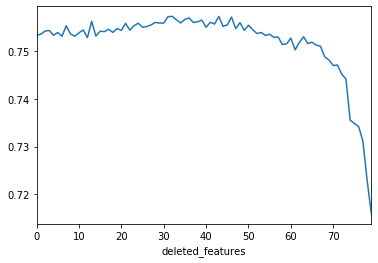

In [ ]:
r.groupby(['deleted_features'])['best_auc'].mean().plot()
# r.groupby(['min_year']).mean()

In [ ]:
cv.groupby(['deleted_features'])['best_auc'].mean()

DataError: No numeric types to aggregate

## Save Model

In [ ]:
import os
import subprocess
import datetime

In [ ]:
%%javascript
IPython.notebook.save_notebook()

In [ ]:
# Optional: Save Dataframe
date = datetime.datetime.today().strftime('%Y-%m-%d')
# try: df.to_csv(f'D:/jasper/03_stoyo/04_Data_Stoyo_2/CSV only videos/combined/{date}_all_clients_combined.csv')
# except: pass

In [ ]:
%notebook "D:/jasper/98_general_projects/03_UFC_Predictions/Backup/ufcstats_scraper.ipynb"  
_ = subprocess.call(f'jupyter nbconvert ufcstats_scraper.ipynb --output D:\\jasper\\98_general_projects\\03_UFC_Predictions/Backup/{date}_ufcstats_scraper.html"'); del _
print('\nFEIERABEND!!!')